# Carga datos

In [1]:
import pandas as pd

In [ ]:
!wget -O df_final.csv "https://github.com/Eze-Mz/mentoria_2025/raw/main/datasets/df_final.csv"

--2025-09-17 18:05:21--  https://github.com/Eze-Mz/mentoria_2025/raw/main/datasets/df_final.csv
Resolving github.com (github.com)... 4.228.31.150
Connecting to github.com (github.com)|4.228.31.150|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Eze-Mz/mentoria_2025/main/datasets/df_final.csv [following]
--2025-09-17 18:05:21--  https://raw.githubusercontent.com/Eze-Mz/mentoria_2025/main/datasets/df_final.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13101337 (12M) [text/plain]
Saving to: ‘df_final.csv’

df_final.csv        100%[===================>]  12.49M  77.4MB/s    in 0.2s    

2025-09-17 18:05:21 (77.4 MB/s) - ‘df_final.csv’ saved [13101337/13101337]



In [2]:
df = pd.read_csv("df_final.csv", encoding="utf-8-sig")
df_original = df.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8882 entries, 0 to 8881
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id_str                   8882 non-null   int64  
 1   date                     8882 non-null   object 
 2   rawContent               8882 non-null   object 
 3   replyCount               8882 non-null   int64  
 4   retweetCount             8882 non-null   int64  
 5   likeCount                8882 non-null   float64
 6   quoteCount               8882 non-null   int64  
 7   conversationId           8882 non-null   int64  
 8   hashtags                 8882 non-null   object 
 9   viewCount                8882 non-null   float64
 10  pcia                     8882 non-null   object 
 11  mes                      8882 non-null   int64  
 12  user_id                  8882 non-null   int64  
 13  pcia1                    8882 non-null   object 
 14  hashtags1               

# BERTopic

[Bertopic](https://maartengr.github.io/BERTopic/index.html) es una librería de Python para hacer topic modeling desarrolada por Maarten Grootendorst, [este](https://github.com/MaartenGr/BERTopic) es el github. Organiza el proceso en los siguientes pasos:

1. Embeddings: preprocesamiento, tokenización y generación de embeddings
2. Dimensionality Reduction: por defecto UMAP
3. Clustering: por defecto HDBSCAN
4. Tokenizer: otra tokenización para generar la representación de los tópicos
5. Weighting Scheme: es una representación más de los tópicos
6. Representation Tuning - Large Language Models (LLM)

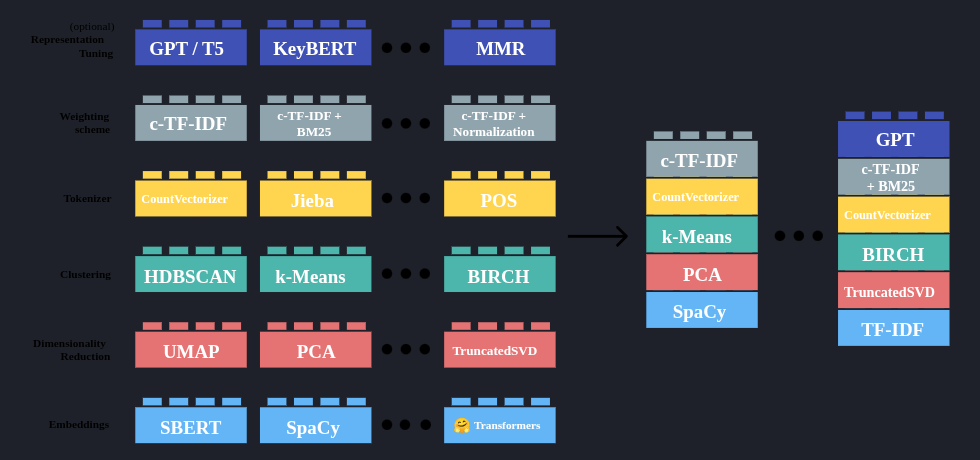

Como se ve en la imagen cada paso es modular y permite intercambiar distintas partes, algunos algoritmos o herramientas son más fáciles de implementar que otros.



# UMAP

- https://www.youtube.com/watch?v=eN0wFzBA4Sc

**Algunas ideas:**

Imaginemos que tenemos datos de altura y peso de personas y los graficamos en 2 dimensiones (peso en la X, altura en la Y), para **encontrar clusters y outliers**. Si agregamos la edad ahora tenemos 3 dimensiones y si queremos agregar más entonces tenemos **muchas dimensiones que no permiten visualizar los grupos ni los outliers**.

Qué podemos hacer? PCA por ejemplo, **solo funciona bien cuando las 2 primeras componentes principales capturan la mayor varianza de los datos**. Otra opción es usar UMAP: Uniform Manifold Approximation and Projection. UMAP es **rápido** incluso con dataset largos y **ejemplos similares tienden a estar juntos**.

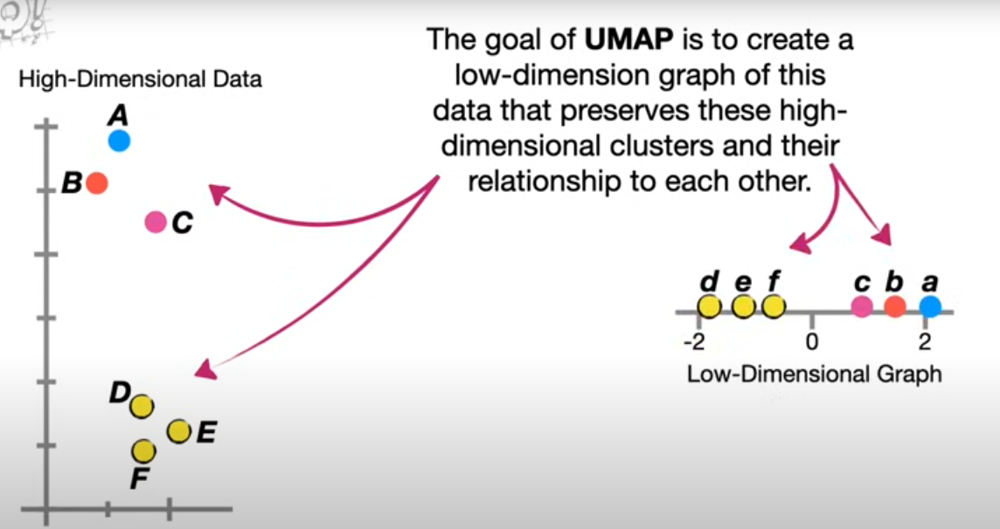

La idea general es: inicializar los puntos en una dimensión menor y luego moverlos hasta que forman clusters que tienen la misma relación que se observa en una dimensión mayor. Dado que A, B y C están juntos y separados de los otros en el gráfico 2D, se replica en el gráfico 1D.

Proyectar los datos en una dirección no funcionaría, por ejemplo en el gráfico 2D si proyectamos los puntos en el eje X entonces aparecerían todos juntos y ensimismados. Por ello UMAP calcula **similarity scores** que le ayudan a identificar los clusters y preservarlos.

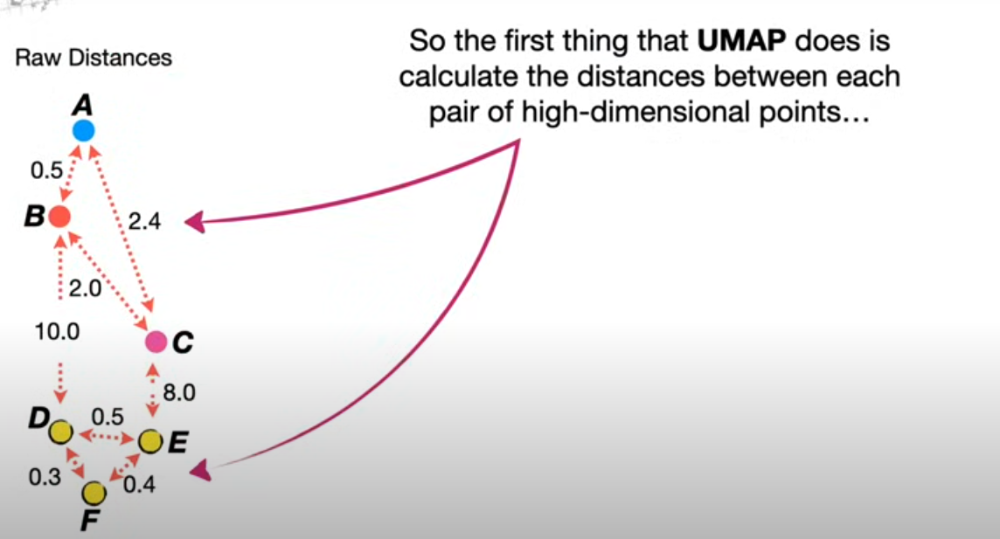

 - Primero ponemos los puntos en el gráfico de menos dimensiones, por ejemplo empezamos por el punto A, cuando ponemos los otros respetamos la distancia de los scores calculados, así, B está a 0.5 unidades de A y C está a 2.4 unidades de A, mientras que los puntos amarillos están todos más lejos.
 - Ahora dibujamos una curva sobre los datos para calcular los similarity scores, la forma de esta curva depende del número de **neighbors** que queremos que tenga cada punto (el nro incluye al punto mismo). En este ejemplo necesitamos que sea 3.
 - UMAP toma el $\log_2$ del número de vecinos que queremos que tenga:
 $\log_2(\text{num.neighbors}) = \log_2(3)=1.6$ Y este valor define la forma de la curva, las coordenadas en Y de los vecinos cercanos suman $\log_2(\text{num.neighbors})$, como se ve en la imagen:

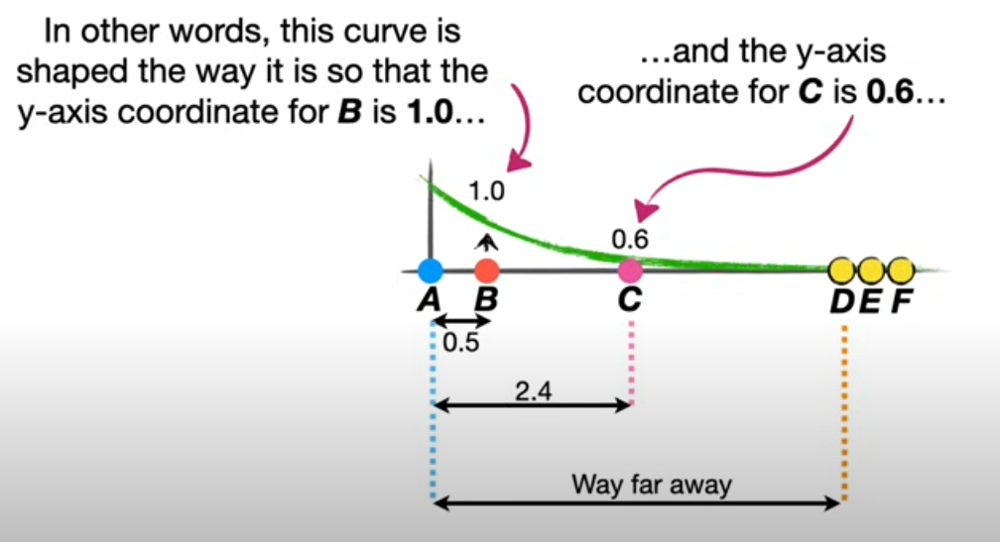

- Las coordenadas en el eje Y para B y C son sus similarity scores relativos al punto A.
- Hacemos lo mismo que hemos hecho para A, para B y C. Como estos valores no son simétricos, UMAP los hace simétricos usando un método similar a tomar el promedio.
- Luego de inicializar los datos en una dimensión menor, UMAP toma dos puntos que deben acercarse. Elije al azar cuál debe acercarse al otro. Luego decide un punto del cual el seleccionado debe alejarse. Luego define cuánto debe moverse el punto seleccionado.
- Luego selecciona otro par de puntos para hacer lo mismo. Y así hasta que logra replicar los clusters en las dimensiones más altas.

> **UMAP es muy similar a t-SNE**, en términos de sus ideas principales son casi lo mismo. Las principales diferencias son: t-SNE empieza con una **inicialización random** del grafo de menos dimensiones mientras que UMAP utiliza **spectral embeddings**, y **la otra diferencia es que t-SNE mueve cada punto un poquito en cada iteración, mientras que UMAP mueve un punto o un grupo de puntos cada iteración** lo que lo ayuda a escalar bien con datasets grandes.

Cuando tenemos muchos datos y un valor bajo de vecinos esto resulta en grupos pequeños e independientes, mientras que un número alto pinta más la big-picture.

# Implementación básica

In [5]:
# solo en colab
#%%capture
#!pip install bertopic

In [3]:
docs = df.rawContent_clean.to_list()

In [4]:
from bertopic import BERTopic

topic_model = BERTopic(language="multilingual")
# .fit -> https://github.com/MaartenGr/BERTopic/blob/master/bertopic/_bertopic.py#L357
# descarga el modelo
topics, probs = topic_model.fit_transform(docs)

El proceso que hace lo anterior es similar al código siguiente:

```python
from umap import UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer

from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
from bertopic.vectorizers import ClassTfidfTransformer


# Step 1 - Extract embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Step 2 - Reduce dimensionality
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')

# Step 3 - Cluster reduced embeddings
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# Step 4 - Tokenize topics
vectorizer_model = CountVectorizer(stop_words="english")

# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()

# Step 6 - (Optional) Fine-tune topic representations with
# a `bertopic.representation` model
representation_model = KeyBERTInspired()

# All steps together
topic_model = BERTopic(
  embedding_model=embedding_model,          # Step 1 - Extract embeddings
  umap_model=umap_model,                    # Step 2 - Reduce dimensionality
  hdbscan_model=hdbscan_model,              # Step 3 - Cluster reduced embeddings
  vectorizer_model=vectorizer_model,        # Step 4 - Tokenize topics
  ctfidf_model=ctfidf_model,                # Step 5 - Extract topic words
  representation_model=representation_model # Step 6 - (Optional) Fine-tune topic representations
)
```

Para calcular la "distancia intertópica" y crear ese mapa 2D, BERTopic no calcula una simple distancia, sino que proyecta las representaciones de los tópicos desde un espacio de alta dimensión a uno de 2 dimensiones usando el algoritmo UMAP.

Lo más importante es la métrica de distancia que usa UMAP, la cual depende del tipo de representación del tópico:
- Si se usan Embeddings de Tópicos, la métrica es la distancia coseno (metric="cosine"). Esta mide el ángulo entre los vectores. Tópicos semánticamente similares tendrán vectores que apuntan en direcciones parecidas, resultando en una distancia coseno pequeña.
  ```embeddings = UMAP(..., metric="cosine", ...).fit_transform(embeddings)```
- Si se usan los vectores c-TF-IDF, la métrica es la distancia Hellinger (metric="hellinger"). Esta métrica es ideal para comparar distribuciones de probabilidad, que es esencialmente lo que son los vectores c-TF-IDF (una distribución de la importancia de las palabras).

> Por defecto no utiliza c-TF-IDF

El gráfico de Plotly hace lo siguiente:

- Posición (x, y): Usa las dos dimensiones resultantes de UMAP para posicionar cada círculo en el mapa.
- Tamaño: El tamaño de cada círculo es proporcional al número de documentos que contiene ese tópico (su frecuencia).el gráfico de Plotly hace lo siguiente:


In [5]:
# https://github.com/MaartenGr/BERTopic/blob/master/bertopic/_bertopic.py#L2546
# https://maartengr.github.io/BERTopic/api/plotting/topics.html
topic_model.visualize_topics(use_ctfidf=False)

In [6]:
# https://maartengr.github.io/BERTopic/api/plotting/barchart.html#bertopic.plotting._barchart.visualize_barchart
topic_model.visualize_barchart()

In [7]:
# https://maartengr.github.io/BERTopic/api/plotting/documents.html#bertopic.plotting._documents.visualize_documents
# Do note that this re-calculates the embeddings and reduces them to 2D
topic_model.visualize_documents(docs)

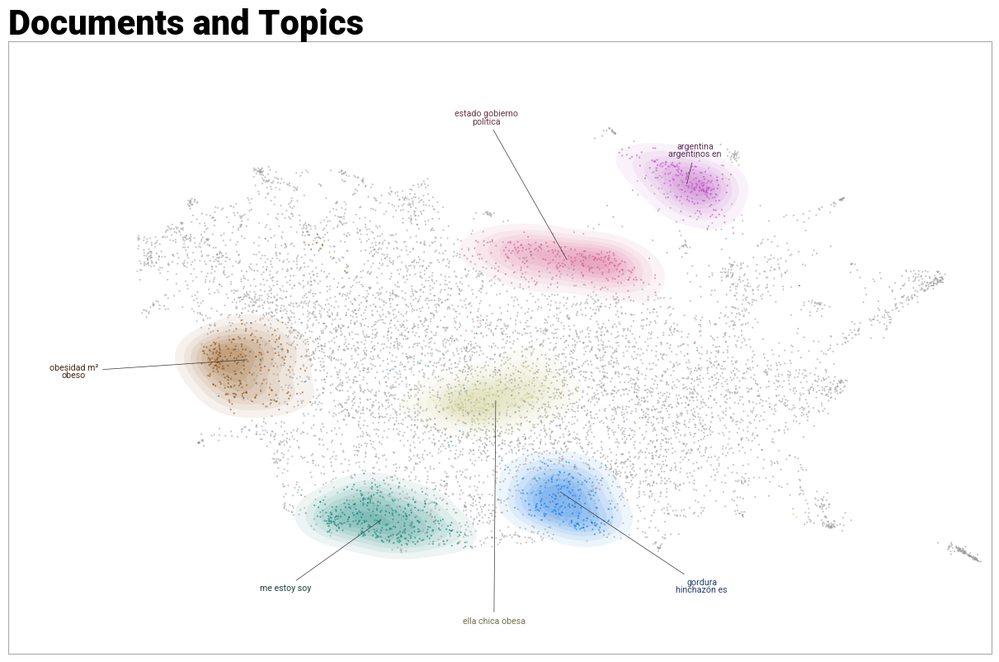

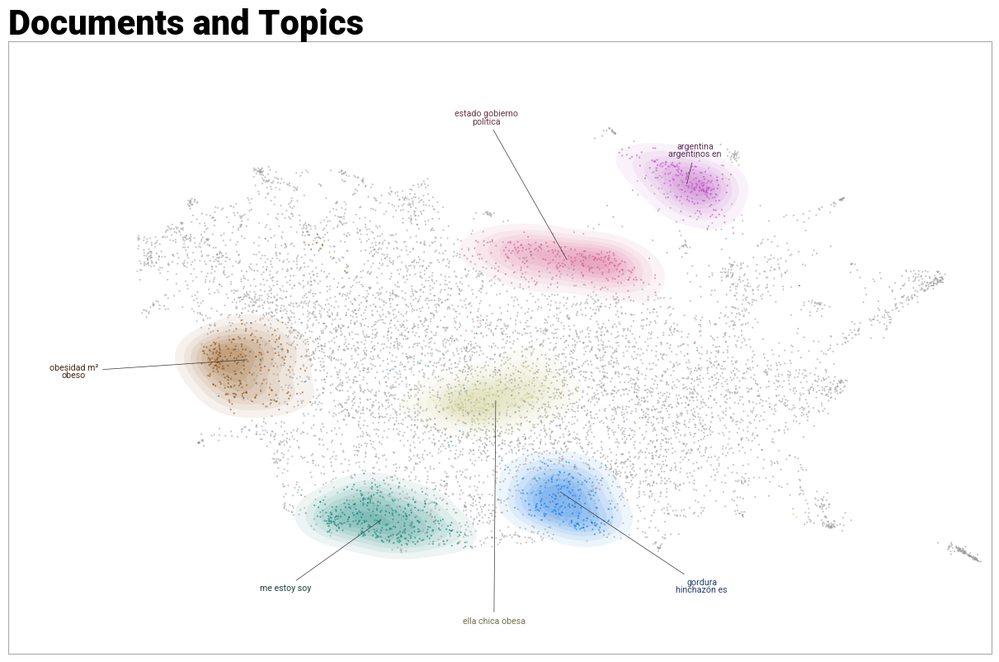

In [8]:
topic_model.visualize_document_datamap(docs, topics=[0,1,2,3,4,5])

# Implementación más trabajada

## Revisión de los textos

- Cantidad de tokens
- "Ruido" en el texto, qué no nos aporta información relevante para la generación del embedding, esto dependerá del modelo elegido, si es uno entrenado en twitter tal vez tenga sentido dejar los hashtags y menciones. Algunos ejemplos:
  - Mayúsculas y minúsculas
  - Puntuación y números (en principio, dejarlos)
  - Generalmente no se eliminan stopwords
  - Generamente no se realiza lematización y stemming
  - Se mantienen los acentos y diacríticos
- Tener en cuenta el idioma

Vamos a probar con RoBERTuito y con algún modelo de la librería [SBERT](https://sbert.net/) (Sentence BERT), probablemente "all-mpnet-base-v2"


### sentence-transformers/paraphrase-multilingual-mpnet-base-v2

https://huggingface.co/sentence-transformers/paraphrase-multilingual-mpnet-base-v2

This is a sentence-transformers model: It maps sentences & paragraphs to a 768 dimensional dense vector space and can be used for tasks like clustering or semantic search.

```
all-mpnet-base-v2 -> ESTE ES SOLO PARA INGLÉS, CAPAZ NO FUNCIONE MUY BIEN
https://huggingface.co/sentence-transformers/all-mpnet-base-v2
```
**Sentence-Transformers es un Envoltorio (Wrapper)**: La librería sentence-transformers es una capa de alto nivel construida sobre Hugging Face. Cuando cargas un modelo de SBERT, la librería hace dos cosas:
- Descarga el modelo pre-entrenado desde el Hub de Hugging Face.
- Descarga el tokenizador correspondiente a ese modelo (ej. BertTokenizerFast).

**El Tokenizador es de Hugging Face**: El objeto tokenizer_sbert de tu código es una instancia de una clase de la librería transformers, como AutoTokenizer. No es algo que SBERT invente, sino que usa el tokenizador oficial con el que el modelo fue entrenado.

uando ejecutas tokenizer_sbert(docs, ...), ocurren los siguientes pasos para cada texto en la lista docs:
- Tokenización: El texto se divide en "tokens" (palabras o sub-palabras) según las reglas del modelo (ej. WordPiece para BERT). "Hola mundo" -> ['hola', 'mun', '##do'].
- Conversión a IDs: Cada token se mapea a un número entero (ID) del vocabulario del modelo. ['hola', 'mun', '##do'] -> [8324, 1525, 2255].
- Añadir Tokens Especiales: Si add_special_tokens=True, se añaden los tokens que el modelo necesita para entender la estructura de la secuencia, como [CLS] al inicio y [SEP] al final.
- Creación del Batch: El resultado de todos los textos se agrupa en un objeto BatchEncoding, que es básicamente un diccionario que contiene listas de input_ids, attention_mask (si se solicita), etc.

In [3]:
from sentence_transformers import SentenceTransformer

/home/ezequiel/ESTUDIO/estudio/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [41]:
model_sbert = SentenceTransformer('sentence-transformers/paraphrase-multilingual-mpnet-base-v2')
#model_sbert = SentenceTransformer('hiiamsid/sentence_similarity_spanish_es')

tokenizer_sbert = model_sbert.tokenizer

In [42]:
docs = df.rawContent_clean.to_list()

# https://huggingface.co/docs/transformers/en/main_classes/tokenizer#transformers.PreTrainedTokenizer.__call__
# https://github.com/huggingface/transformers/blob/v4.56.2/src/transformers/tokenization_utils_base.py#L2828
batch_encoding = tokenizer_sbert(
    docs,
    add_special_tokens=True,    # [CLS], [SEP], etc.
    truncation=False,           # do not cut off any tokens
    padding=False,               # pad each sequence to the max length in this batch
    return_attention_mask=False,
    return_token_type_ids=False,
)

Token indices sequence length is longer than the specified maximum sequence length for this model (154 > 128). Running this sequence through the model will result in indexing errors


In [43]:
# la cantidad de documentos tokenizados
# los input_ids son los números de los tokens (https://huggingface.co/docs/transformers/en/glossary#input-ids)
len(batch_encoding.input_ids)

8882

In [44]:
all_token_lists = [
    tokenizer_sbert.convert_ids_to_tokens(ids)
    for ids in batch_encoding["input_ids"]
]

In [45]:
print(all_token_lists[0])

['<s>', '▁Bol', 'uda', '▁ahí', '▁dice', '▁que', '▁yo', '▁debería', '▁pesar', '▁43', 'kg', '▁eso', '▁está', '▁para', '▁el', '▁orto', '.', '▁Yo', '▁sé', '▁que', '▁tengo', '▁sobre', 'pes', 'o', '▁y', '▁por', '▁eso', '▁estoy', '▁empeza', 'ndo', '▁a', '▁cuidar', 'me', '▁más', '▁para', '▁bajar', '▁de', '▁peso', ',', '▁por', '▁mi', '▁altura', '▁mi', '▁peso', '▁ideal', '▁sería', '▁64', '</s>']


- ▁Bol
- 15
- [x1, x2, ..., xn]


In [46]:
all_lengths = [len(toks) for toks in all_token_lists]
all_lengths[0:10]

[48, 39, 20, 27, 52, 16, 15, 41, 19, 58]

In [47]:
df[f"feature_tokens_sbert"] = all_token_lists
df[f"feature_tokens_len_sbert"] = all_lengths

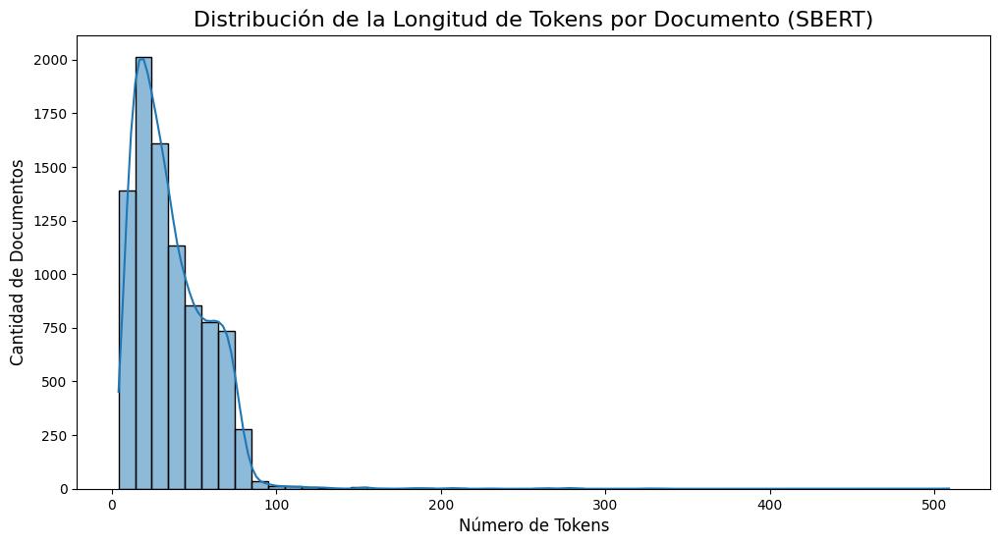

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Crear el histograma
sns.histplot(df["feature_tokens_len_sbert"], kde=True, bins=50)

# Añadir títulos y etiquetas
plt.title("Distribución de la Longitud de Tokens por Documento (SBERT)", fontsize=16)
plt.xlabel("Número de Tokens", fontsize=12)
plt.ylabel("Cantidad de Documentos", fontsize=12)

# Mostrar el gráfico
plt.show()

En principio no vmaos a tener problemas con las represetnaciones de los documentos ya que su basta mayoría tiene menos de 128 tokens.

In [49]:
import collections

# 1. Aplanar la lista de listas en una sola lista de tokens
all_tokens = [token for sublist in all_token_lists for token in sublist]

# 2. Definir y filtrar los tokens especiales que no queremos contar
special_tokens = ["[CLS]", "[SEP]", "[PAD]", "<s>", "</s>"]
tokens_sin_especiales = [token for token in all_tokens if token not in special_tokens]

# 3. Contar la frecuencia de cada token
token_counts = collections.Counter(tokens_sin_especiales)

# 4. Obtener y mostrar los 20 tokens más comunes
print("Los 20 tokens más frecuentes:")
for token, count in token_counts.most_common(20):
    print(f"{token:<20} {count}")

Los 20 tokens más frecuentes:
▁de                  9464
,                    8887
.                    8285
▁que                 7093
▁la                  6228
▁y                   5436
o                    4895
▁a                   4763
s                    3943
▁obes                3880
▁no                  3665
▁el                  3525
▁en                  3299
▁es                  3187
▁con                 3065
a                    2862
▁un                  2482
▁obesidad            2224
▁se                  2049
▁los                 1956


Ese carácter, que a veces se visualiza como un guion bajo _ pero en realidad es un carácter especial de espacio       (U+2581), **indica que el token corresponde al inicio de una palabra que tenía un espacio antes de ella**.

**El Tokenizador: SentencePiece**

El modelo que estás usando (paraphrase-multilingual-mpnet-base-v2) utiliza un tokenizador llamado SentencePiece. A diferencia de los tokenizadores más antiguos como WordPiece (usado por BERT), SentencePiece no divide el texto por espacios antes de tokenizar. Trata el texto como un flujo continuo y aprende a codificar los espacios como parte de los tokens.

**¿Cómo Funciona?**

- Un token sin el prefijo (ej. obesidad) significa que esta palabra estaba al comienzo del texto o pegada a la palabra anterior sin espacio.
- Un token con el prefijo (ej.  obesidad) significa que en el texto original había un espacio antes de la palabra "obesidad".



### Robertuito

In [13]:
import torch
from transformers import AutoTokenizer, AutoModel

In [14]:
model_name = "pysentimiento/robertuito-base-uncased"
device = "cuda" if torch.cuda.is_available() else "cpu"
tokenizer_robertuito = AutoTokenizer.from_pretrained(model_name)
model_robertuito = AutoModel.from_pretrained(model_name).to(device)

Some weights of RobertaModel were not initialized from the model checkpoint at pysentimiento/robertuito-base-uncased and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [15]:
max_len = model_robertuito.config.max_position_embeddings
print(f"The maximum model length is: {max_len}")
print("vocabulary size:", tokenizer_robertuito.vocab_size)
print("special tokens:", tokenizer_robertuito.all_special_tokens)
print("special token ids:", tokenizer_robertuito.all_special_ids)
print("model input names:", tokenizer_robertuito.model_input_names)
print("max context size:", tokenizer_robertuito.model_max_length)

The maximum model length is: 130
vocabulary size: 30000
special tokens: ['<s>', '</s>', '<unk>', '<pad>', '<mask>']
special token ids: [0, 2, 3, 1, 4]
model input names: ['input_ids', 'token_type_ids', 'attention_mask']
max context size: 1000000000000000019884624838656


In [16]:
df[f"feature_tokens_robertuito"] = df['rawContent_clean'].apply(
      lambda x: tokenizer_robertuito.encode((x))
  )
df[f"feature_tokens_len_robertuito"] = df[f"feature_tokens_robertuito"].apply(len)

In [17]:
df[["feature_tokens_robertuito", "feature_tokens_len_robertuito"]]

,feature_tokens_robertuito,feature_tokens_len_robertuito
0,"[0, 8254, 1411, 1254, 443, 560, 2517, 4337, 11...",44
1,"[0, 3035, 413, 1858, 2112, 3710, 5904, 3060, 4...",31
2,"[0, 446, 12539, 413, 507, 18486, 599, 706, 437...",18
3,"[0, 23217, 471, 4497, 582, 924, 412, 4337, 939...",24
4,"[0, 774, 474, 694, 12811, 452, 446, 856, 18065...",43
...,...,...
8877,"[0, 583, 507, 1402, 45, 446, 19547, 489, 443, ...",27
8878,"[0, 1226, 27997, 3375, 437, 445, 4497, 3375, 4...",23
8879,"[0, 4761, 464, 442, 1004, 5233, 583, 442, 2651...",11
8880,"[0, 870, 412, 507, 2787, 474, 582, 804, 6179, ...",20


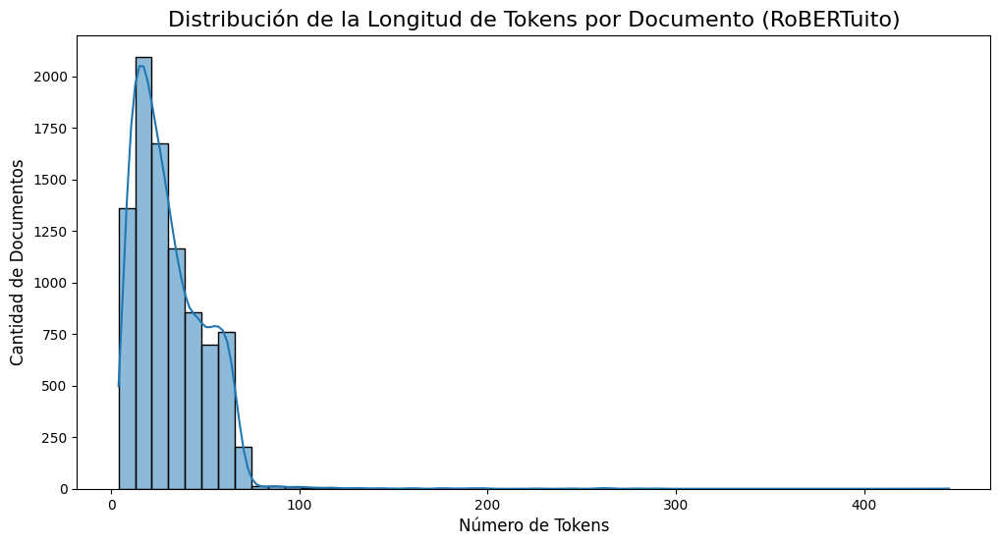

In [18]:
plt.figure(figsize=(12, 6))

# Crear el histograma
sns.histplot(df["feature_tokens_len_robertuito"], kde=True, bins=50)

# Añadir títulos y etiquetas
plt.title("Distribución de la Longitud de Tokens por Documento (RoBERTuito)", fontsize=16)
plt.xlabel("Número de Tokens", fontsize=12)
plt.ylabel("Cantidad de Documentos", fontsize=12)

# Mostrar el gráfico
plt.show()

## Embeddings

### sentence-transformer

In [50]:
# transformar los documentos a minúsculas antes de generar los embeddings
df["rawContent_clean_lower"] = df["rawContent_clean"].str.lower()
docs = df.rawContent_clean_lower.to_list()

In [51]:
# https://sbert.net/docs/package_reference/sentence_transformer/SentenceTransformer.html#sentence_transformers.SentenceTransformer.encode
embeddings_sbert = model_sbert.encode(docs, show_progress_bar=True, device="cuda:0")

Batches: 100%|██████████| 278/278 [00:07<00:00, 35.79it/s]


In [52]:
embeddings_sbert

array([[ 0.05866887,  0.14356773, -0.01010027, ...,  0.08515014,
        -0.12369075, -0.02704864],
       [-0.01217289,  0.19006963, -0.01119089, ...,  0.04160252,
         0.02012774, -0.09141764],
       [ 0.04744128, -0.01423646, -0.01489111, ...,  0.06859162,
        -0.09358891, -0.04869234],
       ...,
       [ 0.09295882,  0.28021985, -0.0105479 , ...,  0.08177789,
        -0.17000565,  0.00683985],
       [ 0.07021613,  0.10396935, -0.01201593, ...,  0.06157427,
        -0.08187784, -0.07380187],
       [ 0.09861416,  0.2211105 , -0.01578772, ...,  0.04379929,
        -0.08043195, -0.04646375]], shape=(8882, 768), dtype=float32)

##### Encontrar embeddings similares a uno elegido

In [53]:
from sentence_transformers import util
import torch

# Elige el índice del documento que quieres usar como referencia
doc_id = 5000
documento_referencia = df.iloc[doc_id]['rawContent']

print(f"Buscando documentos similares a: '{documento_referencia}'")

# Calcula la similitud del coseno entre el embedding de referencia y todos los demás
# Convertimos los embeddings a tensores de PyTorch para usar la utilidad
embedding_referencia = torch.tensor(embeddings_sbert[doc_id])
todos_los_embeddings = torch.tensor(embeddings_sbert)



Buscando documentos similares a: 'Junio es de Géminis obesa'


In [54]:
# Calculamos la similitud
# https://sbert.net/docs/package_reference/util.html#sentence_transformers.util.cos_sim
cos_scores = util.cos_sim(embedding_referencia, todos_los_embeddings)[0]

In [55]:
# Obtenemos los 5 más similares (sin incluir el documento mismo)
# https://docs.pytorch.org/docs/stable/generated/torch.topk.html
top_results = torch.topk(cos_scores, k=6)
top_results

torch.return_types.topk(
values=tensor([1.0000, 0.7923, 0.7865, 0.7842, 0.7833, 0.7807]),
indices=tensor([5000, 6718, 8258,   58, 6203, 4746]))

In [56]:
# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # Convertimos a float de Python para evitar problemas con tensores
    score_val = score.item()
    idx_val = idx.item()
    
    if idx_val != doc_id:
        results_data.append({
            "Similaridad": score_val,
            "Documento": df.iloc[idx_val]['rawContent']
        })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla (en un notebook, esto se verá como una tabla HTML)
results_df

,Similaridad,Documento
0,0.792326,La tenes atroden obeso
1,0.786476,Lloralo obeso
2,0.784211,como q se queda el puto obeso este lpm
3,0.783313,que obeso
4,0.780651,Entra de onda el obeso


#### Encontrar documentos de acuerdo a una query

In [57]:
# Define el concepto o pregunta que te interesa
query = "fúltbol jugador obeso"

# Codifica tu consulta usando el mismo modelo (ESTE YA ESTÁ EN LA GPU)
query_embedding = model_sbert.encode(query, convert_to_tensor=True, device="cuda:0")

# AQUÍ ESTÁ EL CAMBIO: Mueve el tensor grande a la GPU también
todos_los_embeddings = torch.tensor(embeddings_sbert).to("cuda:0")

# Calcula la similitud del coseno (ahora ambos tensores están en la GPU)
cos_scores = util.cos_sim(query_embedding, todos_los_embeddings)[0]

# Obtenemos los 5 más relevantes
top_results = torch.topk(cos_scores, k=5)

# (El resto de tu código para mostrar los resultados está bien)

# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # .item() mueve el valor de la GPU/CPU a Python, así que esto funciona bien
    score_val = score.item()
    idx_val = idx.item()
    
    # Aquí la variable doc_id no está definida en tu snippet, 
    # asegúrate de que exista si quieres usar este filtro.
    # if idx_val != doc_id:  
    results_data.append({
        "Similaridad": score_val,
        "Documento": df.iloc[idx_val]['rawContent']
    })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla
results_df

,Similaridad,Documento
0,0.805049,Este obeso. link_url
1,0.803902,"Alto obeso parezco en esa foto, tranqui cambio..."
2,0.801636,Pajertario obeso
3,0.800969,Un yankee obeso tiene menos grasa que la cabez...
4,0.798158,COMO NO VA A TENER PESO SI ES UN GORDO OBESO Q...


#### Capturar variabilidad con PCA

In [58]:
import numpy as np
from sklearn.decomposition import PCA

# 1. Inicializar PCA
# Al pasar un float entre 0.0 y 1.0, le pedimos a sklearn que seleccione
# el número de componentes necesarios para alcanzar esa varianza explicada.
pca = PCA(n_components=0.90)

# 2. Ajustar el modelo a los datos y transformarlos
# .fit_transform() hace ambos pasos en uno solo de forma eficiente.
embeddings_sbert_pca = pca.fit_transform(embeddings_sbert)

# El número de componentes que PCA decidió usar
n_componentes_seleccionados = pca.n_components_
print(f"Componentes necesarios para el 90% de varianza: {n_componentes_seleccionados}")

# La suma de la varianza explicada por cada uno de esos componentes
varianza_total_explicada = np.sum(pca.explained_variance_ratio_)
print(f"Varianza total explicada: {varianza_total_explicada:.4f}")

# Las nuevas dimensiones de tus embeddings
print(f"Dimensiones después de PCA: {embeddings_sbert_pca.shape}")

Componentes necesarios para el 90% de varianza: 135
Varianza total explicada: 0.9004
Dimensiones después de PCA: (8882, 135)


#### Visualizar embeddings

In [60]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_sbert_pca)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

- La mayoría de tus documentos son semánticamente similares entre sí. No tratan de temas radicalmente distintos (como "cocina" y "astrofísica"), sino que probablemente giran en torno a un gran tema central con muchas sub-conversaciones interconectadas.
- Los posibles sub-temas no están claramente definidos o se mezclan mucho entre sí.

### robertuito

In [58]:
from tqdm.auto import tqdm

# Create embeddings in mini-batches to track progress
print("\nCreating embeddings...")
batch_size = 32
embeddings_robertuito = []

# The `tqdm` wrapper will now show progress over the batches
for i in tqdm(range(0, len(docs), batch_size)):
    # Get a mini-batch of texts
    batch_texts = docs[i:i + batch_size]

    # Tokenize the batch
    inputs = tokenizer_robertuito(
        batch_texts,
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    # Move inputs to the same device as the model
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Get model outputs for the batch
    with torch.no_grad():
        outputs = model_robertuito(**inputs)

    # Extract [CLS] embeddings and move to CPU
    cls_embeddings = outputs.last_hidden_state[:, 0, :].cpu().numpy()

    # Add the batch embeddings to our main list
    embeddings_robertuito.extend(cls_embeddings)


Creating embeddings...


  0%|          | 0/278 [00:00<?, ?it/s]

torch.Size([32, 71, 768])
tensor([[[ 0.3261,  0.6318, -0.4164,  ...,  0.0664, -0.6688, -0.0170],
         [-0.3841,  0.5946, -0.4032,  ..., -1.8259, -0.3877,  0.9359],
         [-1.8010,  1.3705,  0.0851,  ..., -2.3650,  0.8985, -1.3109],
         ...,
         [ 0.0395,  0.7931, -1.2005,  ...,  1.2327, -1.0526,  0.5424],
         [ 0.0395,  0.7931, -1.2005,  ...,  1.2327, -1.0526,  0.5424],
         [ 0.0395,  0.7931, -1.2005,  ...,  1.2327, -1.0526,  0.5424]],

        [[-0.0088, -0.0741, -0.8572,  ..., -0.5680, -1.0276,  2.6612],
         [ 0.1136,  0.5897, -2.3365,  ..., -2.0237, -0.9730,  1.2154],
         [-0.3235,  1.6387, -0.4102,  ...,  0.4363, -0.7248,  1.0329],
         ...,
         [-0.9792,  0.5538, -1.3528,  ...,  0.4226, -1.0496,  1.4056],
         [-0.9792,  0.5538, -1.3528,  ...,  0.4226, -1.0496,  1.4056],
         [-0.9792,  0.5538, -1.3528,  ...,  0.4226, -1.0496,  1.4056]],

        [[ 0.0286, -1.4108, -1.3569,  ..., -0.2874, -0.4233,  0.8662],
         [-1.0986, 

##### Encontrar embeddings similares a uno elegido

In [59]:
# Elige el índice del documento que quieres usar como referencia
doc_id = 5251
documento_referencia = df.iloc[doc_id]['rawContent']

print(f"Buscando documentos similares a: '{documento_referencia}'")

# Calcula la similitud del coseno entre el embedding de referencia y todos los demás
# Convertimos los embeddings a tensores de PyTorch para usar la utilidad
embedding_referencia = torch.tensor(embeddings_robertuito[doc_id])
todos_los_embeddings = torch.tensor(embeddings_robertuito)



Buscando documentos similares a: 'la obesidad es tan preocupante como un niño desnutrido, por que les cuesta tanto aceptar que eso está mal??'


In [60]:
# Calculamos la similitud
# https://sbert.net/docs/package_reference/util.html#sentence_transformers.util.cos_sim
cos_scores = util.cos_sim(embedding_referencia, todos_los_embeddings)[0]

In [61]:
# Obtenemos los 5 más similares (sin incluir el documento mismo)
# https://docs.pytorch.org/docs/stable/generated/torch.topk.html
top_results = torch.topk(cos_scores, k=6)
top_results

torch.return_types.topk(
values=tensor([1.0000, 0.8164, 0.8153, 0.8091, 0.8071, 0.7952]),
indices=tensor([5251, 6029, 5758,  878, 1305, 4063]))

In [63]:
# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # Convertimos a float de Python para evitar problemas con tensores
    score_val = score.item()
    idx_val = idx.item()
    
    if idx_val != doc_id:
        results_data.append({
            "Similaridad": score_val,
            "Documento": df.iloc[idx_val]['rawContent']
        })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla (en un notebook, esto se verá como una tabla HTML)
results_df

,Similaridad,Documento
0,0.816410,Tanto cuesta asumir que la obesidad es una enf...
1,0.815320,"Lo grave es que en ella quieren mostrar como ""..."
2,0.809088,Por qué normalizan la anorexia? Es un trastorn...
3,0.807060,No quieren admitir que el problema es la obesidad
4,0.795173,Obvio que la tiene pero si hay mucha gente que...


#### Encontrar documentos de acuerdo a una query

In [64]:
def embed_query(query: str, model, tokenizer, device):
    """
    Genera el embedding para una única consulta de texto.
    """
    # El tokenizador espera una lista, así que pasamos la consulta entre corchetes
    inputs = tokenizer(
        [query],
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=128
    )

    # Mueve los inputs al dispositivo correcto (CPU o GPU)
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Obtiene la salida del modelo sin calcular gradientes
    with torch.no_grad():
        outputs = model(**inputs)

    # Extrae el embedding del token [CLS], lo mueve a la CPU y lo convierte a NumPy
    embedding = outputs.last_hidden_state[:, 0, :].cpu().numpy()

    return embedding

In [65]:
# Asegúrate de que model_robertuito, tokenizer_robertuito y device estén definidos
mi_consulta = "Ese jugador de fútbol es gordo"

query_embedding = embed_query(
    query=mi_consulta,
    model=model_robertuito,
    tokenizer=tokenizer_robertuito,
    device=device
)

print(f"La forma del embedding es: {query_embedding.shape}")

La forma del embedding es: (1, 768)


In [66]:
# AQUÍ ESTÁ EL CAMBIO: Mueve el tensor grande a la GPU también
todos_los_embeddings = torch.tensor(embeddings_robertuito)

# Calcula la similitud del coseno (ahora ambos tensores están en la GPU)
cos_scores = util.cos_sim(query_embedding, todos_los_embeddings)[0]

# Obtenemos los 5 más relevantes
top_results = torch.topk(cos_scores, k=5)

# (El resto de tu código para mostrar los resultados está bien)

# Lista para guardar los resultados
results_data = []

# Iteramos para recolectar los datos
for score, idx in zip(top_results[0], top_results[1]):
    # .item() mueve el valor de la GPU/CPU a Python, así que esto funciona bien
    score_val = score.item()
    idx_val = idx.item()
    
    # Aquí la variable doc_id no está definida en tu snippet, 
    # asegúrate de que exista si quieres usar este filtro.
    # if idx_val != doc_id:  
    results_data.append({
        "Similaridad": score_val,
        "Documento": df.iloc[idx_val]['rawContent']
    })

# Creamos un DataFrame a partir de la lista
results_df = pd.DataFrame(results_data)

# Mostramos la tabla
results_df

,Similaridad,Documento
0,0.767779,El pity está obeso
1,0.763019,"Ese lémur está obeso, pobre"
2,0.743197,es un obeso mediocre.
3,0.734775,conechny tiene mentalidad de crack y muñoz de ...
4,0.728943,Es fanático e idiota el Obeso Dan.


#### Visualizar embeddings

In [68]:
import umap.umap_ as umap
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = umap.UMAP(n_neighbors=50, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_robertuito)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

## fasttext

In [69]:
# Nombre del archivo que vamos a crear
output_filename = 'tweets_para_fasttext.txt'

# Seleccionamos la columna y la guardamos en el archivo de texto
df['rawContent_clean'].to_csv(
    output_filename,
    header=False,
    index=False
)

In [94]:
import fasttext

# Asegúrate de tener tu archivo 'tweets_limpios.txt' listo

print("Entrenando modelo FastText con corpus de Twitter...")

modelo_twitter = fasttext.train_unsupervised(
    'tweets_para_fasttext.txt',
    model='skipgram',        # Skipgram es mejor para capturar semántica en datasets más pequeños.
    dim=200,                 # 200 dimensiones es un buen punto de partida. No necesitás 300.
    epoch=50,                # Aumentá las épocas. Con menos datos, necesitás más pasadas.
    minCount=2,              # Ignorá palabras que aparecen menos de n veces. Ayuda a filtrar ruido.
    ws=8,                    # Tamaño de la ventana de contexto. 5 es un estándar.
    minn=2,                  # Longitud mínima de n-grama de caracteres.
    maxn=6,                  # Longitud máxima de n-grama de caracteres.
    neg=20                   # Número de negativos muestreados. Un valor más alto puede ayudar con pocos datos.
)

modelo_twitter.save_model("fasttext_twitter_custom.bin")

print("¡Modelo entrenado y guardado!")

Entrenando modelo FastText con corpus de Twitter...


Read 0M words
Number of words:  11349
Number of labels: 0
Progress: 100.0% words/sec/thread:   18305 lr:  0.000000 avg.loss:  2.407236 ETA:   0h 0m 0s 31.1% words/sec/thread:   18438 lr:  0.034457 avg.loss:  3.033790 ETA:   0h 0m17s 58.5% words/sec/thread:   18375 lr:  0.020740 avg.loss:  2.627498 ETA:   0h 0m10s 70.2% words/sec/thread:   18376 lr:  0.014877 avg.loss:  2.546112 ETA:   0h 0m 7s


¡Modelo entrenado y guardado!


In [95]:
modelo_twitter.get_dimension()

200

In [96]:
docs = df['rawContent_clean']

In [97]:
import re

def tokenizar_para_fasttext(texto):
    """
    Tokeniza el texto de una forma más similar a como lo procesa FastText:
    1. Convierte a minúsculas.
    2. Separa palabras de signos de puntuación.
    """
    texto = texto.lower()
    # Esta expresión regular encuentra secuencias de palabras o signos de puntuación individuales
    tokens = re.findall(r'\b\w+\b|[.,!?;:()]', texto)
    return tokens

def generar_embeddings_documentos(lista_de_documentos, modelo):
    """
    Genera embeddings para una lista de documentos usando average pooling.
    """
    embeddings = []
    dim = modelo.get_dimension() # Obtenemos la dimensión de los vectores del modelo

    for doc in lista_de_documentos:
        tokens_split = doc.split()
        tokens_regex = tokenizar_para_fasttext(doc)
        #print(f"Tokens (split): {tokens_split}")
        #print(f"Tokens (regex): {tokens_regex}")
        tokens = tokens_regex  # Elegimos la tokenización basada en regex para mayor precisión
        if not tokens:
            # Si un documento está vacío, agregamos un vector de ceros
            embeddings.append(np.zeros(dim))
            continue
        
        # Obtenemos el vector de cada token y calculamos el promedio
        # np.mean es muy eficiente para esto
        vector_promedio = np.mean([modelo.get_word_vector(token) for token in tokens], axis=0)
        embeddings.append(vector_promedio)
        
    return np.array(embeddings)


In [98]:
embeddings_fasttext = generar_embeddings_documentos(docs, modelo_twitter)

In [99]:
embeddings_fasttext.shape

(8882, 200)

#### Visualizar embeddings

In [100]:
from umap import UMAP
import plotly.express as px

# Reducimos la dimensionalidad de los embeddings a 2D
reducer = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine')
embeddings_2d = reducer.fit_transform(embeddings_fasttext)

# Creamos un DataFrame para la visualización
df_plot = pd.DataFrame(embeddings_2d, columns=['x', 'y'])
df_plot['documento'] = df['rawContent']

# Creamos el gráfico interactivo
fig = px.scatter(
    df_plot,
    x='x',
    y='y',
    hover_data=['documento'],
    title='Mapa 2D de los Documentos',
    height=600,
    width=800
)
fig.show()

## Implementación

In [3]:
# https://docs.rapids.ai/install/
# https://docs.rapids.ai/api/cuml/stable/estimator_intro/#UMAP-and-Trustworthiness-metrics
# from cuml import UMAP as cUMAP
# from cuml.cluster import HDBSCAN as cHDBSCAN

In [35]:
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
import nltk
from nltk.corpus import stopwords
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance
from bertopic import BERTopic

In [32]:
#nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ezequiel/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [61]:
def calculate_topics(text, embeddings, umap_neighbors=10, umap_components=6, hdbscan_size=5, embedding_model=None):
  # https://umap-learn.readthedocs.io/en/latest/parameters.html
  # low values of n_neighbors will force UMAP to concentrate on very local structure (potentially to the detriment of the big picture)
  # low values of min_dist will result in clumpier embeddings. This can be useful if you are interested in clustering, or in finer topological structure.
  # If you are interested in (density based) clustering, or other machine learning techniques, it can be beneficial to pick a larger embedding dimension (say 10, or 50)
  # metrics: euclidean, coisne, manhattan, chebishev, minkowski, etc.
  umap_model = UMAP(n_neighbors=umap_neighbors, n_components=umap_components, min_dist=0.0, metric='euclidean', random_state=42)

  # https://hdbscan.readthedocs.io/en/latest/parameter_selection.html
  # The default method is 'eom' for Excess of Mass, has a tendency to pick one or two large clusters and then a number of small extra clusters.
  # Instead, a better option is to select 'leaf' as a cluster selection method. This will select leaf nodes from the tree.
  hdbscan_model = HDBSCAN(min_cluster_size=hdbscan_size,
                          metric='euclidean',
                          cluster_selection_method='leaf',
                          leaf_size=100,
                          min_samples=1,
                          prediction_data=True)

  spanish_stopwords = set(stopwords.words('spanish'))
  custom_stopwords = {'ejemplo','ser','estar','así','solo','vez','mientras','ud','si','aquí','eh', 'bueno', 'va', 'ahí','vamos','bien','ver',
                      'entonces','día','hoy','voy','acá','vol'}
  spanish_stopwords.update(custom_stopwords)
  spanish_stopwords = list(spanish_stopwords)

  vectorizer_model = CountVectorizer(stop_words=spanish_stopwords, min_df=0.5, max_df=0.8, ngram_range=(1, 2))

  ctfidf_model = ClassTfidfTransformer(
      bm25_weighting=False,
      reduce_frequent_words=False
  )


  # Agregar diferentes representaciones
  # KeyBERT
  keybert_model = KeyBERTInspired()
  # MMR
  mmr_model = MaximalMarginalRelevance(diversity=0.5)

  representation_model = {
      #"KeyBERT": keybert_model,
      "MMR": mmr_model,
  }

  topic_model = BERTopic(
  # Modelos del pipeline
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,
  ctfidf_model=ctfidf_model,
  # Otras opciones
  top_n_words=10,
  verbose=True,
  calculate_probabilities=True
)

  topics, probs = topic_model.fit_transform(text, embeddings)
  return topics, probs, topic_model

In [101]:
content = df["rawContent_clean"].tolist()
# content_embeddings = embeddings_sbert_pca
content_embeddings = embeddings_fasttext
#content_embeddings = np.array(content_embeddings)

topics, probs, topic_model = calculate_topics(content,
                                              content_embeddings,
                                              umap_neighbors=10,
                                              umap_components=50,
                                              hdbscan_size=90,
                                              embedding_model=model_sbert,
                                              )

2025-09-27 11:57:19,726 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-09-27 11:57:33,339 - BERTopic - Dimensionality - Completed ✓
2025-09-27 11:57:33,341 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-09-27 11:57:36,317 - BERTopic - Cluster - Completed ✓
2025-09-27 11:57:36,320 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-09-27 11:57:36,762 - BERTopic - Representation - Completed ✓


In [102]:
import textwrap

# El ancho en caracteres antes de cortar la línea
wrap_width = 80

# 1. Pre-procesamos la lista de documentos para añadir saltos de línea HTML
# Usamos textwrap para cortar y .replace() para que el gráfico lo entienda
wrapped_content = [textwrap.fill(doc, width=wrap_width).replace('\n', '<br>') for doc in content]

# 2. Ahora generamos el gráfico usando esta nueva lista
reduced_content_embeddings = UMAP(
    n_neighbors=100,
    n_components=2,
    min_dist=0.0,
    metric='cosine'
).fit_transform(content_embeddings)

topic_model.visualize_documents(
    wrapped_content, # <--- Usamos la lista con el texto ya ajustado
    reduced_embeddings=reduced_content_embeddings,
    custom_labels=True,
    hide_annotations=False
)

In [87]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,MMR,Representative_Docs
0,-1,5117,-1_años_mas_personas_cosas,"[años, mas, personas, cosas, alguien, parece, ...","[cosas, comida, dijo, dieta, enfermedad, tiemp...",[Investiguen que comen los luchadores sociales...
1,0,443,0_puta_vas_madre_anda,"[puta, vas, madre, anda, pedazo, gordo obeso, ...","[puta, anda, gordo obeso, gordito, hambre, twi...",[Gordo obeso jaja de puta todo da vueltas en l...
2,1,433,1_siento_dios_re_gordo obeso,"[siento, dios, re, gordo obeso, quiero, dos, g...","[dios, gordo obeso, quiero, gorda obesa, foto,...","[Chicas comí una banda, me siento re gorda obe..."
3,2,397,2_falta_país_trabajo_tampoco,"[falta, país, trabajo, tampoco, parece, enferm...","[país, trabajo, tampoco, enfermedad, hambre, m...",[. van a recibir a esta mujer y darle lo q pid...
4,3,334,3_comida_hambre_van_gordos,"[comida, hambre, van, gordos, dos, doble, país...","[comida, hambre, gordos, país, mayoría, saben,...",[Comida? Son todos obesos los tira piedras de ...
5,4,313,4_etc_falta_respeto_mujer,"[etc, falta, respeto, mujer, hombre, poner, ca...","[respeto, mujer, gordos, tiempo, tampoco, edad...",[Unpopular opinion. Por lejos el más discrimin...
6,5,289,5_diabetes_enfermedades_cáncer_enfermedad,"[diabetes, enfermedades, cáncer, enfermedad, f...","[diabetes, enfermedades, cáncer, sobrepeso obe...",[Realizar actividad física ayuda a prevenir en...
7,6,214,6_chica_dónde_vas_quién,"[chica, dónde, vas, quién, entender, paso, gor...","[chica, gorda obesa, mina, gente obesa, cabeza...",[Discúlpame por corregirte pero nunca verás a ...
8,7,170,7_mayor_exceso_sobrepeso obesidad_diabetes,"[mayor, exceso, sobrepeso obesidad, diabetes, ...","[mayor, sobrepeso obesidad, diabetes, població...","[sirve para regular la insulina, o sea específ..."
9,8,162,8_favor_enfermedad_basta_anda,"[favor, enfermedad, basta, anda, pobre, ah, ba...","[enfermedad, anda, pobre, persona obesa, hdp, ...",[Ay por favor lo que es este pibito dios! Enam...


In [40]:
topic_model.visualize_topics()